In [3]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse.linalg import svds

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [4]:
# user_perfume_data = pd.merge(rating_data, perfume_data, on='perfumeId')
user_perfume_data = pd.read_csv("./user_review_jiho.csv")
user_perfume_data.head()

,userId,title,rating
0,0,lime basil & mandarin jomalone,5.0
1,0,warm cotton clean,4.0
2,0,blackberry & bay jomalone,4.0
3,0,gypsy water byredo,5.0
4,0,mojave ghost byredo,2.0


In [5]:
user_perfume_data.shape


(446, 3)

In [6]:
user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)


In [7]:
user_perfume_rating.shape

(39, 260)

In [8]:
user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [9]:
perfume_user_rating = user_perfume_rating.values.T
perfume_user_rating.shape

(260, 39)

In [10]:
type(perfume_user_rating)

numpy.ndarray

In [11]:
SVD = TruncatedSVD(n_components=12)
matrix = SVD.fit_transform(perfume_user_rating)
matrix.shape

(260, 12)

In [12]:
matrix[0]

array([ 0.21534186,  0.94775642,  0.70499404,  0.28537388,  1.01377574,
        2.06013278,  1.24531151,  0.121331  ,  0.49927237, -0.03635065,
       -0.13566996,  0.28670301])

In [13]:
corr = np.corrcoef(matrix)
corr.shape

(260, 260)

In [14]:
corr2 = corr[:200, :200]
corr2.shape

(200, 200)

<AxesSubplot:>

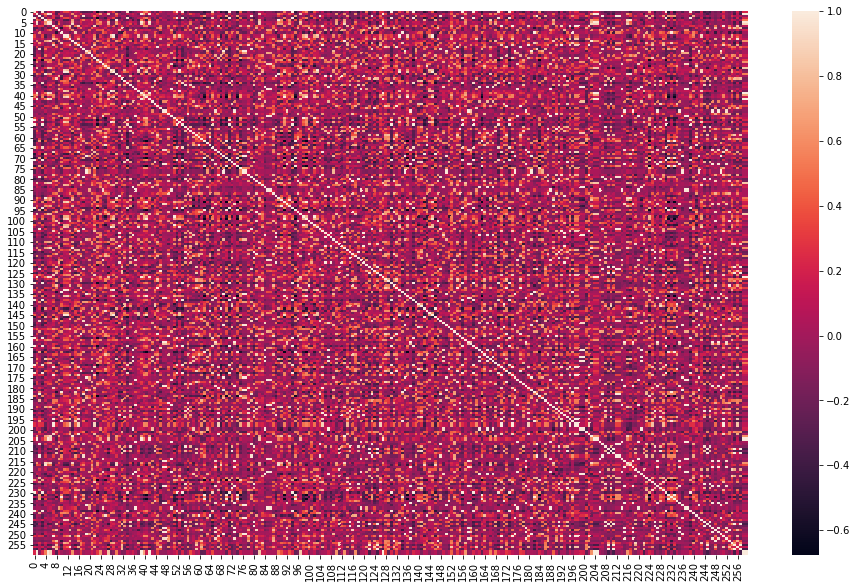

In [15]:
plt.figure(figsize=(16, 10))
sns.heatmap(corr)

In [16]:
perfume_title = user_perfume_rating.columns
perfume_title_list = list(perfume_title)
coffey_hands = perfume_title_list.index("eau triple lichen d'ecosse buly 1803")

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal',
 'tam dao eau de toilette diptyque']

In [17]:
corr_coffey_hands = corr[coffey_hands]
list(perfume_title[(corr_coffey_hands >= 0.9)])

['a la rose maison francis kurkdjian',
 'bergamote 22 le labo',
 "eau triple lichen d'ecosse buly 1803",
 'geranium odorata eau de toilette diptyque',
 'jasmin 17 le labo',
 'lime basil & mandarin jomalone',
 'oud maison francis kurkdjian',
 'rose 31 le labo',
 "rose of no man's land byredo",
 'rose pompon eau de toilette annick goutal']

In [18]:
df_user_perfume_rating = user_perfume_data.pivot_table('rating', index = 'userId', columns='title').fillna(0)

In [19]:
df_user_perfume_rating.head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
userId,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0


In [20]:
matrix = df_user_perfume_rating.values

user_ratings_mean = np.mean(matrix, axis =1)

matrix_user_mean =matrix-user_ratings_mean.reshape(-1,1)

In [21]:
matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [22]:
matrix.shape

(39, 260)

In [23]:
user_ratings_mean.shape

(39,)

In [24]:
pd.DataFrame(matrix_user_mean, columns=df_user_perfume_rating.columns).head()

title,34 boulevard saint germain diptyque,4711 acqua colonia blood orange & basil 4711,a la rose maison francis kurkdjian,agar musk ramon monegal,alizarin penhaligon's,amazing grace ballet rose philosophy,amazing grace philosophy,amber musk aerin lauder,american cream lush,angeli di firenze santa maria novella,...,white suede tom ford,white tea elizabeth arden,wild bluebell jomalone,wood sage & sea salt,wood sage & sea salt jomalone,레이디 고디바 향기의 미술관,은은한 비누 paffem,잔느 사마리의 초상 향기의미술관,코튼키스 포맨트,코튼허그 포맨트
0,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692,...,-0.107692,-0.107692,-0.107692,-0.107692,4.892308,-0.107692,-0.107692,-0.107692,-0.107692,-0.107692
1,-0.153846,-0.153846,-0.153846,-0.153846,2.846154,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,...,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846,-0.153846
2,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,...,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000,-0.100000
3,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,...,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,-0.173077,2.826923,-0.173077,-0.173077,-0.173077
4,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692,...,-0.207692,-0.207692,-0.207692,-0.207692,3.792308,-0.207692,-0.207692,-0.207692,-0.207692,-0.207692


In [25]:
U, sigma, Vt = svds(matrix_user_mean, k=12)

In [26]:
print(U.shape)
print(sigma.shape)
print(Vt.shape)

(39, 12)
(12,)
(12, 260)


In [27]:
sigma = np.diag(sigma)

In [28]:
sigma.shape

(12, 12)

In [29]:
svd_user_predicted_ratings = np.dot(np.dot(U, sigma), Vt) + user_ratings_mean.reshape(-1, 1)

In [30]:
df_svd_preds = pd.DataFrame(svd_user_predicted_ratings, columns = df_user_perfume_rating.columns)
# df_svd_preds.iloc[36]

In [31]:
def recommend_perfumes(df_svd_preds, user_perfume_data, user_id, num_recommendations=10):
    user_row_number = user_id
    sorted_user_predictions = df_svd_preds.iloc[user_row_number].sort_values(ascending=False)
    user_history = user_perfume_data[user_perfume_data.userId == user_id].sort_values(['rating'], ascending=False)
    recommendations = user_perfume_data[~user_perfume_data['title'].isin(user_history['title'])]
    recommendations = recommendations.merge( pd.DataFrame(sorted_user_predictions).reset_index(), on = 'title')
    recommendations = recommendations.rename(columns = {user_row_number: 'Predictions'}).sort_values('Predictions', ascending = False)
    recommendations.reset_index(inplace=True)
    recommendations.drop(["userId", "rating", "index"], axis=1,inplace=True)
    recommendations.drop_duplicates(inplace=True)
    recommendations = recommendations.iloc[:num_recommendations, :]
    return user_history, recommendations

In [32]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 36, 10)

In [33]:
already_rated.head(10)

,userId,title,rating
430,36,tacit aesop,5.0
432,36,touch for men burberry,5.0
433,36,dirty lush,5.0
435,36,tam dao eau de toilette diptyque,5.0
429,36,jazz club maison martin margiela,3.0
431,36,hwyl aesop,3.0
434,36,blanche byredo,2.0


In [34]:
predictions

,title,Predictions
0,pansy lush,0.961439
3,english pear & fressia jomalone,0.930300
12,jasmin 17 le labo,0.851665
14,l'ombre dans l'eau eau de toilette diptyque,0.832414
18,rose of no man's land byredo,0.796515
19,geranium odorata eau de toilette diptyque,0.796515
20,a la rose maison francis kurkdjian,0.785470
22,eau triple lichen d'ecosse buly 1803,0.751553
24,lime basil & mandarin jomalone,0.718231
26,rose 31 le labo,0.650444


In [35]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 37, 10)

In [36]:
already_rated.head(10)

,userId,title,rating
438,37,english pear & fressia jomalone,5.0
436,37,miss dior blooming bouquet christian dior,4.0
437,37,tam dao eau de toilette diptyque,4.0
439,37,blackberry & bay jomalone,2.0


In [37]:
predictions


,title,Predictions
0,blanche byredo,1.118618
9,incanto charms salvatore ferragamo,1.067278
14,eau rose eau de toilette diptyque,0.770356
16,jeanne lanvin lanvin,0.733416
20,wild bluebell jomalone,0.685622
22,marry me lanvin,0.631429
26,replica flower market maison margiela,0.492211
27,nectarine blossom & honey,0.468666
29,eau des sens eau de toilette diptyque,0.462600
33,pansy lush,0.440642


In [38]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 38, 10)

In [39]:
already_rated.head(10)

,userId,title,rating
441,38,ck one calvin klein,5.0
440,38,blanche byredo,4.0
443,38,warm cotton clean,4.0
445,38,tam dao eau de toilette diptyque,4.0
442,38,jazz club maison martin margiela,3.0
444,38,ferrari light essence ferrari,3.0


In [40]:
predictions

,title,Predictions
0,artisan john varvatos,1.371453
4,wood sage & sea salt jomalone,1.339762
13,eclat d'arpege pour homme lanvin,0.976347
19,light blue dolce&gabbana,0.855171
22,english pear & fressia jomalone,0.749555
31,vetyverio eau de toilette diptyque,0.698498
33,blue glow by jlo jennifer lopez,0.641309
40,lucky wish anna sui,0.640386
42,eau des sens eau de toilette diptyque,0.639226
46,tacit aesop,0.587129


# User 38
## CK One
### Top Notes
Lemon, Green, Bergamot, Pineapple, Mandarin Orange, Cardamom, Papaya

### Middle Notes
Lily-of-the-Valley, Jasmine, Violet, Nutmeg, Rose, Orris Root, Freesia

### Base Notes
Green, Musk, Cedar, Sandalwood, Oakmoss, Amber, Green Tea


## Blanche Byredo
### Top Notes
Aldehydes, Rose, Pink Pepper

### Middle Notes
Peony Violet African Orange Flower

### Base Notes
Musk, Woody Notes, Sandalwood


## Tam Dao
### Top Notes
Italian Cypress, Myrtle, Rose

### Middle Notes
Sandalwood Cedar

### Base Notes 
Brazilian Rosewood, Spices, Amber, White Musk



## Artisan John Varvatos
### Top
Clementine, Tangerine, Marjoram, Thyme
### Middle
Orange Blossom, Ginger, Lavender, Jasmine
### Base Notes
Musk, Woodsy Notes, Amber



In [50]:
already_rated, predictions = recommend_perfumes(df_svd_preds, user_perfume_data, 2, 10)
print(already_rated.head(10))
predictions

    userId                            title  rating
18       2            eclat d'arpege lanvin     5.0
19       2             jeanne lanvin lanvin     5.0
20       2  english pear & fressia jomalone     5.0
21       2        illicit flower jimmy choo     5.0
22       2            jimmy choo jimmy choo     3.0
23       2         flight of fancy anna sui     3.0


,title,Predictions
0,miss dior blooming bouquet christian dior,1.236485
5,incanto charms salvatore ferragamo,1.048222
10,blackberry & bay jomalone,0.775529
20,eau rose eau de toilette diptyque,0.763920
22,dalilight salvador dali,0.640715
24,tam dao eau de toilette diptyque,0.626920
30,blanche byredo,0.584763
39,american cream lush,0.581376
41,le jardin de monsieur li hermès,0.576253
43,nectarine blossom & honey,0.534832
